In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from statsmodels.tsa.seasonal import DecomposeResult, seasonal_decompose

**Dataset: Metro Interstate Traffic Volume**  
See : https://archive.ics.uci.edu/dataset/492/metro+interstate+traffic+volume  
Hourly Minneapolis-St Paul, MN traffic volume for westbound I-94. Includes weather and holiday features from 2012-2018.   
Hourly weather features and holidays included for impacts on traffic volume.

**1. Import et mise en forme de la donnée**

In [2]:
df = pd.read_csv(r'data\Metro_Interstate_Traffic_Volume.csv.gz', compression='gzip')
print(df.shape)
df.head(5)

(48204, 9)


,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume
0,NaN,288.28,0.0,0.0,40,Clouds,scattered clouds,2012-10-02 09:00:00,5545
1,NaN,289.36,0.0,0.0,75,Clouds,broken clouds,2012-10-02 10:00:00,4516
2,NaN,289.58,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 11:00:00,4767
3,NaN,290.13,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 12:00:00,5026
4,NaN,291.14,0.0,0.0,75,Clouds,broken clouds,2012-10-02 13:00:00,4918


In [3]:
df.drop_duplicates(subset=['date_time'], keep='first', inplace=True)
print(df.shape)

(40575, 9)


In [4]:
missing_percentage = (df.isna().sum() / len(df)) * 100
rounded_missing_percentage = round(missing_percentage, 2)
print(rounded_missing_percentage[rounded_missing_percentage > 0])

holiday    99.87
dtype: float64


Pas de valeurs manquantes à part pour la colonne **holiday**.  
Néammoins, on va remarquer que il y a des valeurs manquantes "cachées" : les time stamps ne sont pas continues.  
C'est à dire qu'il y a pas d'observations pour tous les jours et heures.

In [5]:
df['date_time'] = pd.to_datetime(df['date_time'])
start, end = df['date_time'].min(), df['date_time'].max()
full_range = pd.date_range(start=start, end=end, freq='h')

missing_timestamps = full_range.difference(df['date_time'])

print("Timestamps manquants :")
print(len(missing_timestamps) / len(full_range) * 100)


gaps = (missing_timestamps[1:] - missing_timestamps[:-1]) != pd.Timedelta(hours=1)
gap_indices = [0] + (gaps.nonzero()[0] + 1).tolist() + [len(missing_timestamps)]

longest_gap = max(
    (missing_timestamps[gap_indices[i]:gap_indices[i+1]] for i in range(len(gap_indices)-1)),
    key=len
)

print("\nLa plus longue période de données manquantes est de", len(longest_gap), "heures : entre le", longest_gap.min(), "et le", longest_gap.max())


# missing value per year
missing_by_year = pd.Series(missing_timestamps).dt.year.value_counts().sort_index()
print("\nValeurs manquantes par années")
print(missing_by_year)

Timestamps manquants :
22.78929040360792

La plus longue période de données manquantes est de 7386 heures : entre le 2014-08-08 02:00:00 et le 2015-06-11 19:00:00

Valeurs manquantes par années
2012      72
2013    1466
2014    4259
2015    5167
2016     946
2017      47
2018      19
Name: count, dtype: int64


Plusieurs problèmes:
- 23% de valeurs manquantes c'est assez élevé.
- Aucune valeurs quasiment pendant un an (Aout 2014 à Juin 2015) : inimputable

=> On va couper le dataset et ne garder que les 3,5 dernières années à peu près. On peut modifier la date pour réduire les valeurs manquantes quitte à un peu réduire le nombre total d'observation.

In [6]:
df = df[df["date_time"] >= "2015-06-19 17:00:00"]
print("Nombre d'observations après tronquage", len(df))
start, end = df['date_time'].min(), df['date_time'].max()
full_range = pd.date_range(start=start, end=end, freq='h')

missing_timestamps = full_range.difference(df['date_time'])

print("\nTimestamps manquants :")
print(len(missing_timestamps) / len(full_range) * 100)

gaps = (missing_timestamps[1:] - missing_timestamps[:-1]) != pd.Timedelta(hours=1)
gap_indices = [0] + (gaps.nonzero()[0] + 1).tolist() + [len(missing_timestamps)]

longest_gap = max(
    (missing_timestamps[gap_indices[i]:gap_indices[i+1]] for i in range(len(gap_indices)-1)),
    key=len
)

print("\nLa plus longue période de données manquantes est de", len(longest_gap), "heures : entre le", longest_gap.min(), "et le", longest_gap.max())


# missing value per year
missing_by_year = (pd.Series(missing_timestamps).dt.year.value_counts()).sort_index()
print(missing_by_year)

Nombre d'observations après tronquage 26670

Timestamps manquants :
7.337919533041484

La plus longue période de données manquantes est de 92 heures : entre le 2015-10-23 12:00:00 et le 2015-10-27 07:00:00
2015    1100
2016     946
2017      47
2018      19
Name: count, dtype: int64


On garde quand même plus de 30k pas de temps + 7% de valeurs manquantes qu'il faudra donc imputer

**Remplissage des valeurs manquantes**

Pour l'instant j'ai fait ça pour continuer l'exploration mais à voir s'il y a d'autres manières

In [7]:
# merge full_range with df and impute missing value with interpolation
full_df = pd.DataFrame({'date_time': full_range})
df = full_df.merge(df, on='date_time', how='left')
df['holiday'] = df['holiday'].fillna('None')
df['weather_main'] = df['weather_main'].fillna('None')
df['weather_description'] = df['weather_description'].fillna('None')
df.set_index("date_time", inplace=True)
df['traffic_volume'] = df['traffic_volume'].interpolate(method='time')
df["temp"] = df["temp"].interpolate(method='time')
df["rain_1h"] = df["rain_1h"].interpolate(method='time')
df["snow_1h"] = df["snow_1h"].interpolate(method='time')
df["clouds_all"] = df["clouds_all"].interpolate(method='time')

print(df.isna().sum())
print(len(df))


holiday                0
temp                   0
rain_1h                0
snow_1h                0
clouds_all             0
weather_main           0
weather_description    0
traffic_volume         0
dtype: int64
28782


In [8]:
df.describe()

,temp,rain_1h,snow_1h,clouds_all,traffic_volume
count,28782.000000,28782.000000,28782.000000,28782.000000,28782.000000
mean,282.797633,0.402709,0.000253,41.993711,3313.651049
std,12.359583,57.952687,0.007989,39.048717,1958.420883
min,243.390000,0.000000,0.000000,0.000000,0.000000
25%,273.580000,0.000000,0.000000,1.000000,1326.000000
50%,284.745000,0.000000,0.000000,40.000000,3506.125000
75%,292.880000,0.000000,0.000000,90.000000,4946.000000
max,310.070000,9831.300000,0.510000,100.000000,7280.000000


**Description des variables**

In [9]:
df["holiday"].value_counts()

holiday
None                         28747
Independence Day                 4
State Fair                       4
Labor Day                        4
Columbus Day                     3
Veterans Day                     3
Thanksgiving Day                 3
Christmas Day                    3
New Years Day                    3
Washingtons Birthday             3
Memorial Day                     3
Martin Luther King Jr Day        2
Name: count, dtype: int64

In [10]:
df["weather_main"].value_counts(normalize=True)

weather_main
Clear           0.334758
Clouds          0.297547
Rain            0.110868
Mist            0.075950
None            0.073379
Snow            0.055000
Haze            0.018519
Drizzle         0.014106
Thunderstorm    0.013967
Fog             0.005385
Smoke           0.000521
Name: proportion, dtype: float64

In [11]:
df["weather_description"].value_counts(normalize=True)

weather_description
sky is clear                           0.302481
overcast clouds                        0.095476
scattered clouds                       0.083177
broken clouds                          0.083003
mist                                   0.075950
None                                   0.073379
light rain                             0.059273
light snow                             0.047460
moderate rain                          0.036029
few clouds                             0.035890
Sky is Clear                           0.032277
haze                                   0.018519
proximity thunderstorm                 0.010840
heavy intensity rain                   0.010805
light intensity drizzle                0.009624
snow                                   0.005594
fog                                    0.005385
proximity shower rain                  0.004065
drizzle                                0.003996
thunderstorm                           0.001876
heavy snow          

**2. Analyse exploratoire des données**

Text(0.5, 1.0, 'Traffic Volume Over Time')

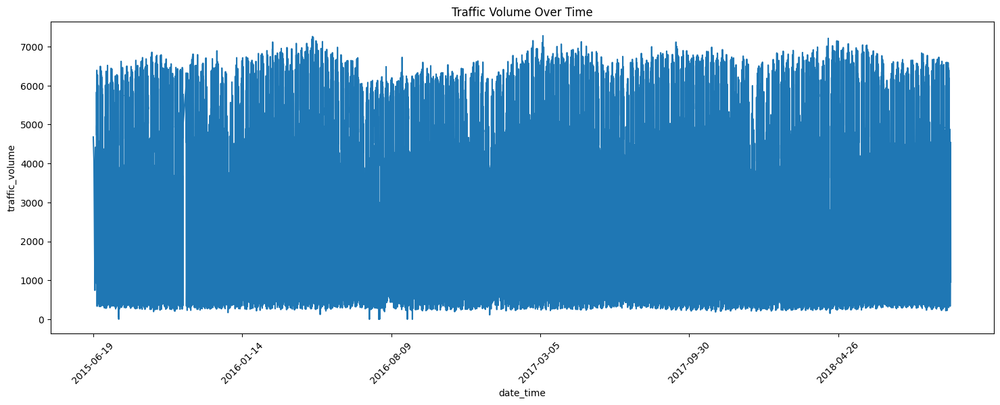

In [12]:
plt.figure(figsize=(18, 6))
sns.lineplot(x=df.index, y='traffic_volume', data=df)
plt.xticks(df.index[::5000], rotation=45)
plt.title('Traffic Volume Over Time')

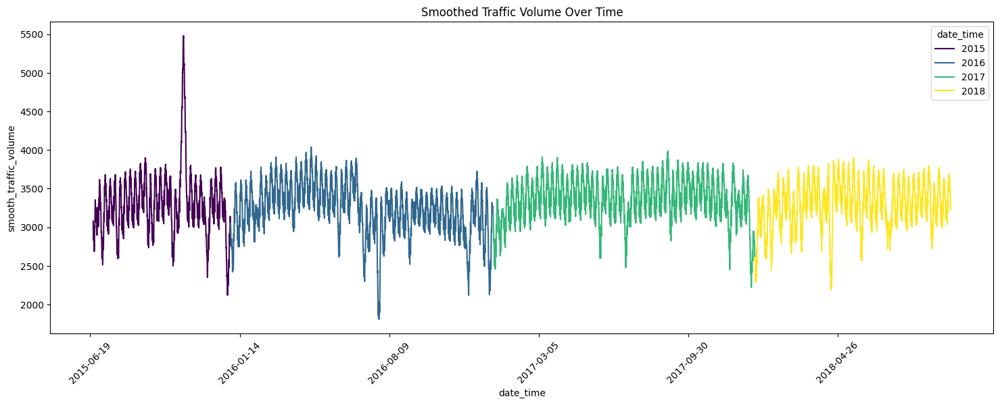

In [13]:
df['smooth_traffic_volume'] = df['traffic_volume'].rolling(window=100).mean()
colors = df.index.year
plt.figure(figsize=(18, 6))
sns.lineplot(x=df.index, y='smooth_traffic_volume', data=df, hue=colors, palette='viridis')
plt.xticks(df.index[::5000], rotation=45)
plt.title('Smoothed Traffic Volume Over Time')
plt.show()

==> On voit quelques outliers vers le bas (regarder les dates et voir s'il y a une signification)

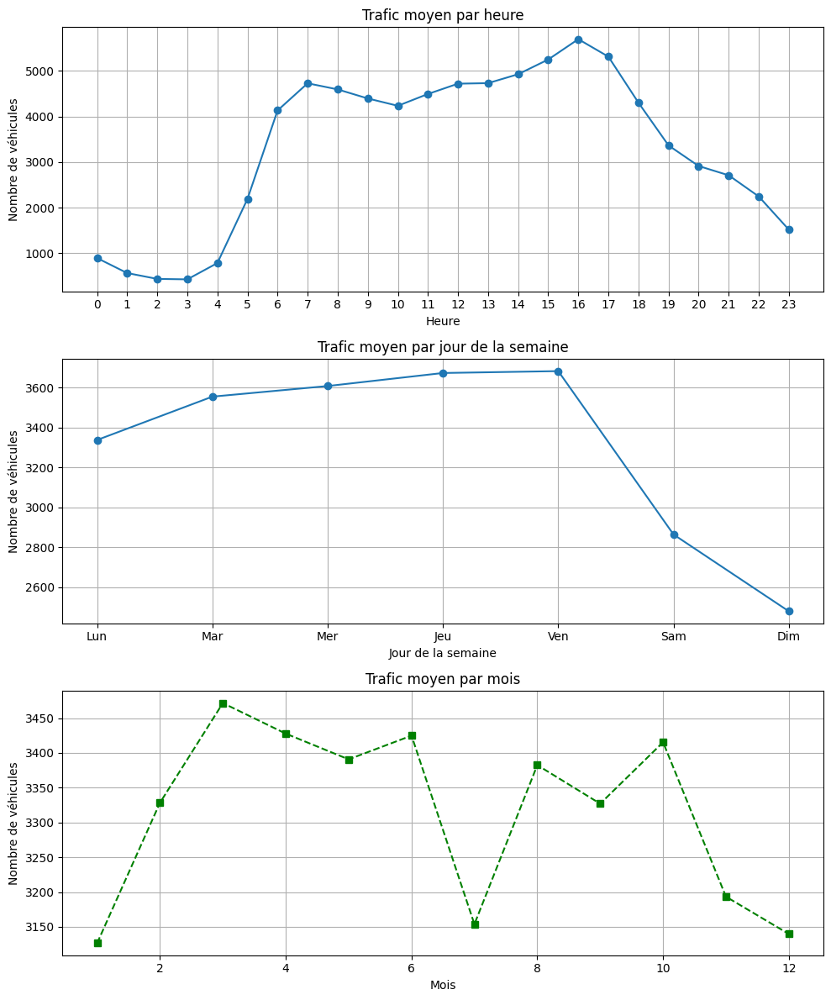

In [14]:
df["Hour"] = df.index.hour
df["Day"] = df.index.dayofweek 
df["Month"] = df.index.month

hourly_traffic = df.groupby("Hour")["traffic_volume"].mean()
daily_traffic = df.groupby("Day")["traffic_volume"].mean()
monthly_traffic = df.groupby("Month")["traffic_volume"].mean()

fig, axes = plt.subplots(3, 1, figsize=(10, 12))

axes[0].plot(hourly_traffic.index, hourly_traffic.values, marker='o')
axes[0].set_title("Trafic moyen par heure")
axes[0].set_xlabel("Heure")
axes[0].set_ylabel("Nombre de véhicules")
axes[0].grid(True)
axes[0].set_xticks(hourly_traffic.index)


axes[1].plot(daily_traffic.index, daily_traffic.values, marker='o', linestyle='-')
axes[1].set_xticks(range(7))
axes[1].set_xticklabels(["Lun", "Mar", "Mer", "Jeu", "Ven", "Sam", "Dim"])
axes[1].set_title("Trafic moyen par jour de la semaine")
axes[1].set_xlabel("Jour de la semaine")
axes[1].set_ylabel("Nombre de véhicules")
axes[1].grid(True)

axes[2].plot(monthly_traffic.index, monthly_traffic.values, marker='s', linestyle='--', color='g')
axes[2].set_title("Trafic moyen par mois")
axes[2].set_xlabel("Mois")
axes[2].set_ylabel("Nombre de véhicules")
axes[2].grid(True)

plt.tight_layout()
plt.show()

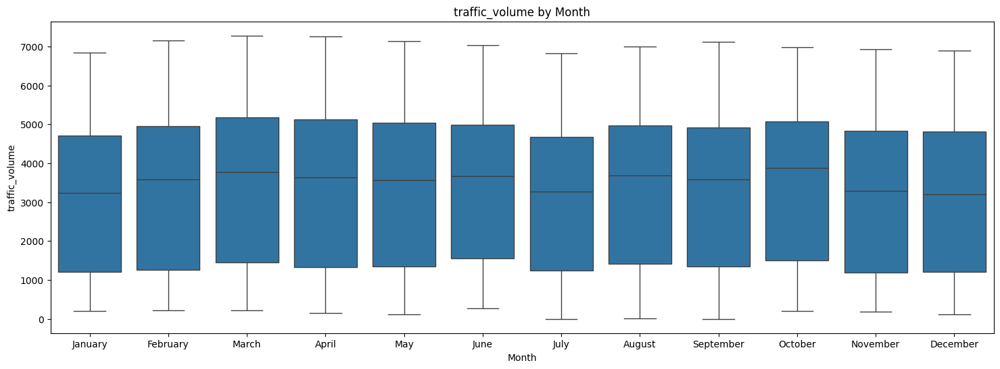

In [15]:
# box plot per month
df['Month'] = pd.Categorical(df.index.month_name(), categories=[
    'January', 'February', 'March', 'April', 'May', 'June', 'July', 'August', 'September', 'October', 'November', 'December'], ordered=True)
plt.figure(figsize=(18, 6))
sns.boxplot(x='Month', y='traffic_volume', data=df)
plt.title('traffic_volume by Month')
plt.show()

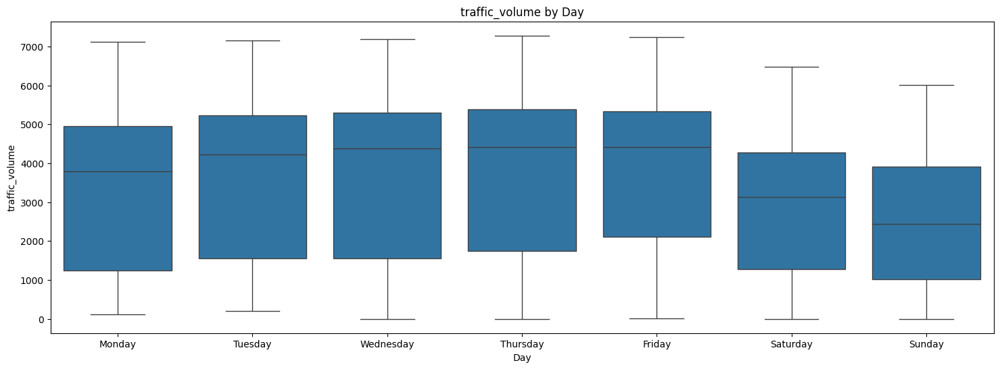

In [16]:
# box plot per day
df['Day'] = df.index.day_name()
plt.figure(figsize=(18, 6))
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
sns.boxplot(x='Day', y='traffic_volume', data=df, order=day_order)
plt.title('traffic_volume by Day')
plt.show()

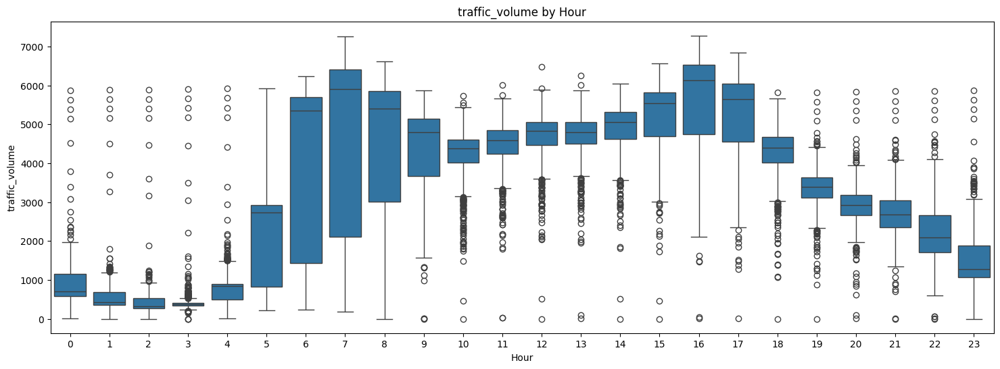

In [17]:
# box plot per hour
plt.figure(figsize=(18, 6))
sns.boxplot(x='Hour', y='traffic_volume', data=df)
plt.title('traffic_volume by Hour')
plt.show()

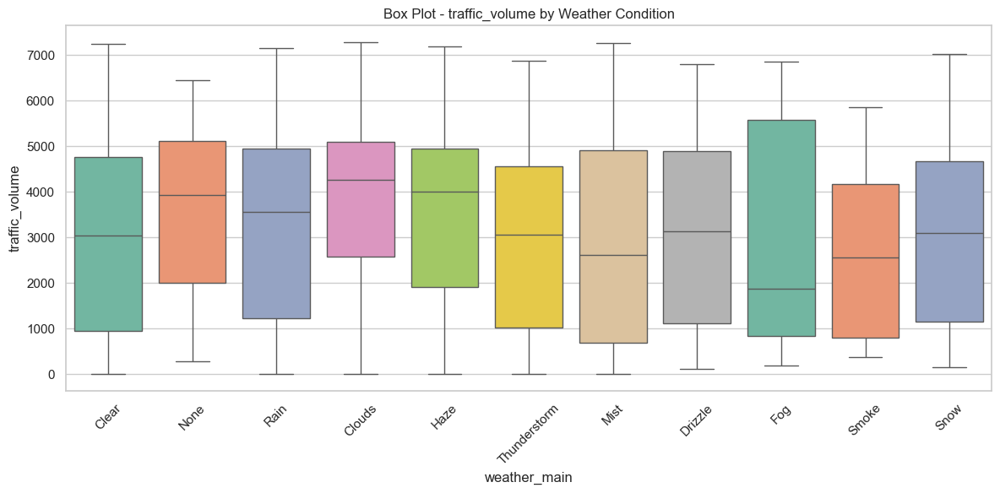

In [18]:
sns.set(style="whitegrid")
plt.figure(figsize=(12, 6))
sns.boxplot(x='weather_main', y='traffic_volume', hue='weather_main', data=df, palette='Set2', legend=False)
plt.title('Box Plot - traffic_volume by Weather Condition')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

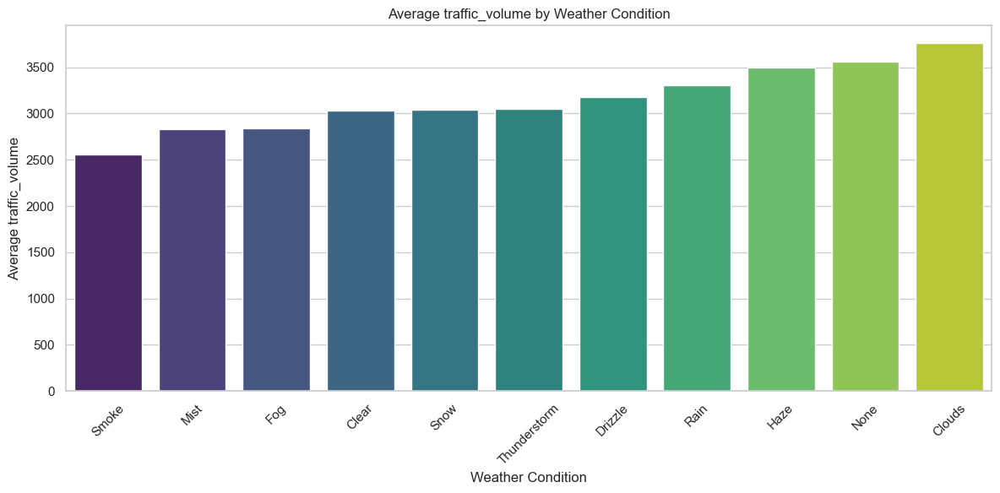

In [19]:
weather_traffic = df.groupby("weather_main", observed=True)["traffic_volume"].mean().sort_values()
plt.figure(figsize=(12, 6))
sns.barplot(x=weather_traffic.index, y=weather_traffic.values, hue=weather_traffic.index, palette='viridis', dodge=False, legend=False)
plt.title('Average traffic_volume by Weather Condition')
plt.xlabel('Weather Condition')
plt.ylabel('Average traffic_volume')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [20]:
result = seasonal_decompose(df["traffic_volume"], model='additive')

def plot_seasonal_decompose(result: DecomposeResult, title="Seasonal Decomposition"):
    return (
        make_subplots(
            rows=4,
            cols=1,
            subplot_titles=["Observed", "Trend", "Seasonal", "Residuals"],
        )
        .add_trace(
            go.Scatter(x=result.seasonal.index, y=result.observed, mode="lines"),
            row=1,
            col=1,
        )
        .add_trace(
            go.Scatter(x=result.trend.index, y=result.trend, mode="lines"),
            row=2,
            col=1,
        )
        .add_trace(
            go.Scatter(x=result.seasonal.index, y=result.seasonal, mode="lines"),
            row=3,
            col=1,
        )
        .add_trace(
            go.Scatter(x=result.resid.index, y=result.resid, mode="lines"),
            row=4,
            col=1,
        )
        .update_layout(
            height=900, title=title, margin=dict(t=100), title_x=0.5, showlegend=False
        )
    )

plot_seasonal_decompose(result).show()

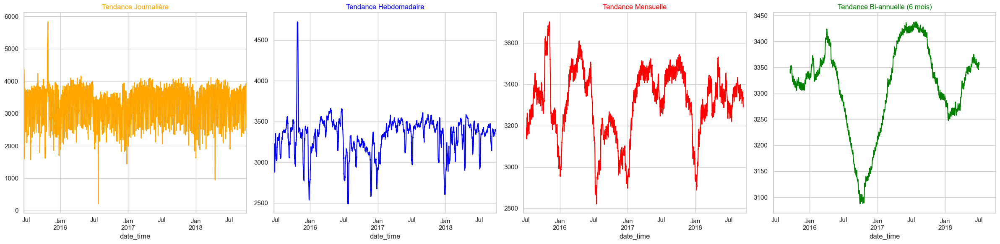

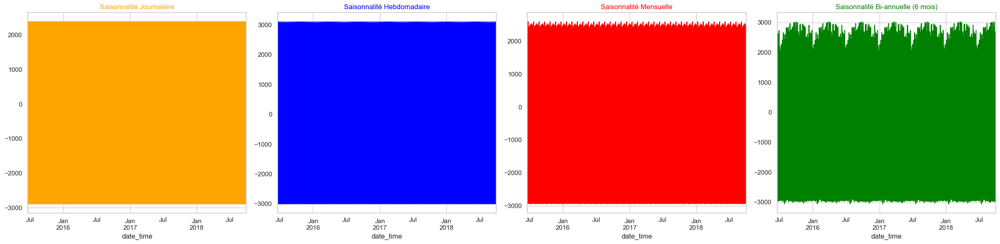

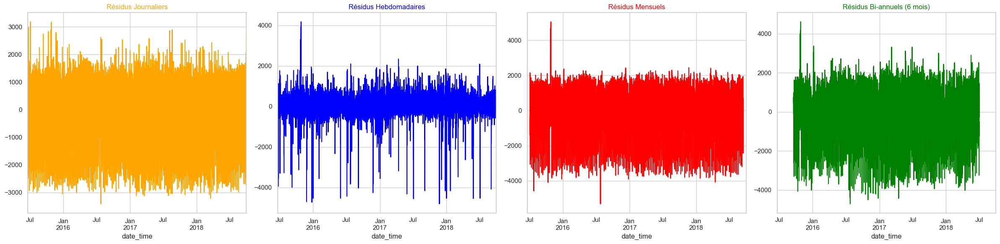

In [21]:
decomp_daily = seasonal_decompose(df["traffic_volume"], model="additive", period=24)
decomp_weekly = seasonal_decompose(df["traffic_volume"], model="additive", period=24*7)
decomp_monthly = seasonal_decompose(df["traffic_volume"], model="additive", period=24*30)
decomp_biannual = seasonal_decompose(df["traffic_volume"], model="additive", period=24*30*6)

colors = {
    "daily": "orange",
    "weekly": "blue",
    "monthly": "red",
    "biannual": "green"
}

fig, axes = plt.subplots(1, 4, figsize=(24, 6))

axes[0].set_title("Tendance Journalière", color=colors["daily"])
decomp_daily.trend.plot(ax=axes[0], color=colors["daily"])

axes[1].set_title("Tendance Hebdomadaire", color=colors["weekly"])
decomp_weekly.trend.plot(ax=axes[1], color=colors["weekly"])

axes[2].set_title("Tendance Mensuelle", color=colors["monthly"])
decomp_monthly.trend.plot(ax=axes[2], color=colors["monthly"])

axes[3].set_title("Tendance Bi-annuelle (6 mois)", color=colors["biannual"])
decomp_biannual.trend.plot(ax=axes[3], color=colors["biannual"])

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 4, figsize=(24, 6))

axes[0].set_title("Saisonnalité Journalière", color=colors["daily"])
decomp_daily.seasonal.plot(ax=axes[0], color=colors["daily"])

axes[1].set_title("Saisonnalité Hebdomadaire", color=colors["weekly"])
decomp_weekly.seasonal.plot(ax=axes[1], color=colors["weekly"])

axes[2].set_title("Saisonnalité Mensuelle", color=colors["monthly"])
decomp_monthly.seasonal.plot(ax=axes[2], color=colors["monthly"])

axes[3].set_title("Saisonnalité Bi-annuelle (6 mois)", color=colors["biannual"])
decomp_biannual.seasonal.plot(ax=axes[3], color=colors["biannual"])

plt.tight_layout()
plt.show()

fig, axes = plt.subplots(1, 4, figsize=(24, 6))

axes[0].set_title("Résidus Journaliers", color=colors["daily"])
decomp_daily.resid.plot(ax=axes[0], color=colors["daily"])

axes[1].set_title("Résidus Hebdomadaires", color=colors["weekly"])
decomp_weekly.resid.plot(ax=axes[1], color=colors["weekly"])

axes[2].set_title("Résidus Mensuels", color=colors["monthly"])
decomp_monthly.resid.plot(ax=axes[2], color=colors["monthly"])

axes[3].set_title("Résidus Bi-annuels (6 mois)", color=colors["biannual"])
decomp_biannual.resid.plot(ax=axes[3], color=colors["biannual"])

plt.tight_layout()
plt.show()


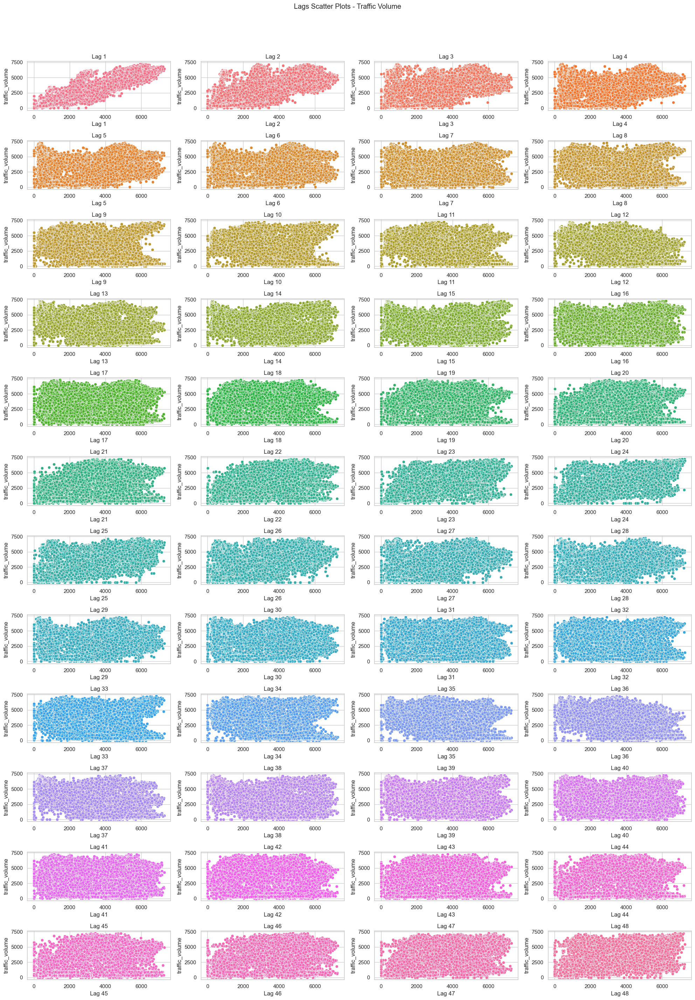

In [34]:
lags = 48
fig, axs = plt.subplots(12, 4, figsize=(20, 30))
fig.suptitle('Lags Scatter Plots - Traffic Volume')

for i in range(1, lags + 1):
    ax = axs[(i-1)//4, (i-1)%4]
    df[f'lag_{i}'] = df['traffic_volume'].shift(i)
    sns.scatterplot(
        x=df[f'lag_{i}'], 
        y=df['traffic_volume'], 
        ax=ax,
        color=sns.color_palette("husl", lags)[i-1]
    )
    ax.set_title(f'Lag {i}')
    ax.set_xlabel(f'Lag {i}')
    ax.set_ylabel('traffic_volume')

plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()